<a href="https://colab.research.google.com/github/LenaVolzhina/playing-with-kaggle/blob/master/clouds/explore_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepare


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
from datetime import datetime

In [3]:
import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

In [4]:
import seaborn as sns

sns.set_style('whitegrid')

sns.__version__

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


'0.10.1'

In [5]:
path_to_data = '/content/drive/My Drive/Colab Notebooks/kaggle clouds/data/'
!ls "{path_to_data}"

sample_submission.csv  test_images  train.csv  train_images


In [6]:
import pandas as pd

train_data = pd.read_csv(path_to_data + 'train.csv')
train_data['Image'] = train_data['Image_Label'].apply(lambda s: s.split('_')[0])
train_data['Label'] = train_data['Image_Label'].apply(lambda s: s.split('_')[1])

print(train_data.shape)
train_data.head()

(22184, 4)


,Image_Label,EncodedPixels,Image,Label
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


In [29]:
labels = ['Fish', 'Flower', 'Gravel', 'Sugar']

def get_mask_from_rle(rle, h, w):
    mask = np.zeros(shape=h * w)
    splitted = list(map(int, rle.split()))
    for start, length in zip(splitted[::2], splitted[1::2]):
        start -= 1
        mask[start:start + length] = 1
    
    return mask.reshape((w, h)).T.astype(int)

In [8]:
H, W = 1400, 2100

def rle_to_percent(rle):
    if not isinstance(rle, str):
        return 0.
    
    mask = get_mask_from_rle(rle, H, W)
    return mask.mean()
 
print(datetime.now())
train_data['Perc'] = train_data['EncodedPixels'].apply(rle_to_percent)
print(datetime.now())

2020-09-12 13:07:04.350067
2020-09-12 13:09:35.185499


# Plot images


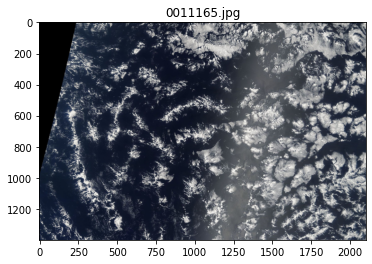

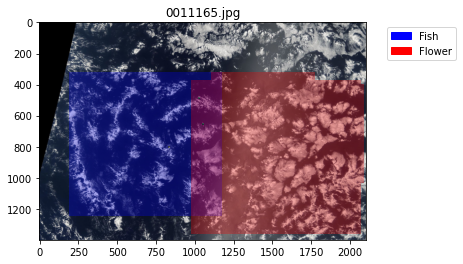

In [ ]:
colors = {'Fish': 'blue', 'Flower': 'red', 'Gravel': 'yellow', 'Sugar': 'white'}
cmaps = {key: matplotlib.colors.ListedColormap(['black', val]) for key, val in colors.items()}   # convert to colormaps

def show_image(image, show_masks=True):
    img = mpimg.imread('{}train_images/{}'.format(path_to_data, image))
    h, w, _ = img.shape

    plt.figure()
    plt.imshow(img)
    plt.title(image)

    if show_masks:
        data = train_data[train_data.Image == image]
        used_labels = []
        for label in labels:
            # plt.figure()
            rle = data[data.Label == label]['EncodedPixels'].values[0]
            if isinstance(rle, str):
                used_labels.append(label)
                mask = get_mask_from_rle(rle, h, w)
                mask[mask == 0] = np.nan
                plt.imshow(
                    mask, alpha=0.3, cmap=cmaps[label], label=label, vmin=0, vmax=1
                )
                
        # legend etc
        patches = [matplotlib.patches.Patch(color=colors[label], label=label) for label in used_labels]
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2)
    
show_image('0011165.jpg', False)
show_image('0011165.jpg', True)

In [ ]:
# for img in list(set(train_data.Image))[:2]:
#     show_image(img, False)
#     show_image(img, True)

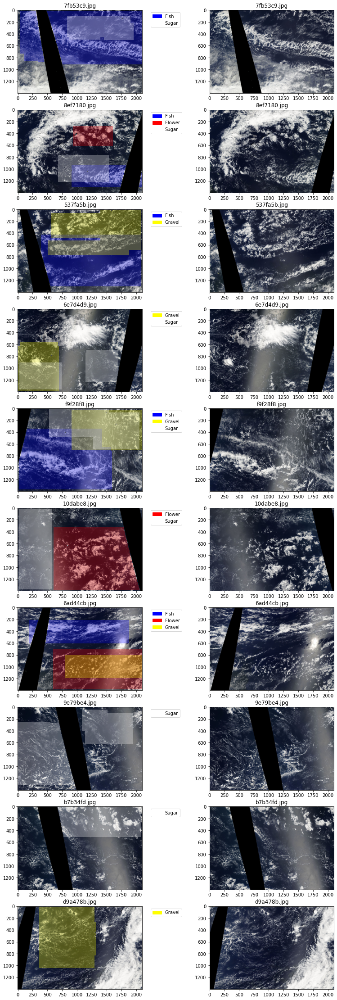

In [ ]:
def show_image_ax(image, ax, show_masks=True):
    img = mpimg.imread('{}train_images/{}'.format(path_to_data, image))
    h, w, _ = img.shape

    # plt.figure()
    ax.imshow(img)
    ax.set_title(image)

    if show_masks:
        data = train_data[train_data.Image == image]
        used_labels = []
        for label in labels:
            # plt.figure()
            rle = data[data.Label == label]['EncodedPixels'].values[0]
            if isinstance(rle, str):
                used_labels.append(label)
                mask = get_mask_from_rle(rle, h, w)
                mask[mask == 0] = np.nan
                ax.imshow(
                    mask, alpha=0.3, cmap=cmaps[label], label=label, vmin=0, vmax=1
                )
                
        # legend etc
        patches = [matplotlib.patches.Patch(color=colors[label], label=label) for label in used_labels]
        ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2)


nimg = 10
_, axes = plt.subplots(nrows=nimg, ncols=2, figsize=(2 * 7, nimg * 4))
for img, (ax1, ax2) in zip(list(set(train_data.Image)), axes):
    show_image_ax(img, ax1, True)
    show_image_ax(img, ax2, False)

# Classes balance

Check that all images are the same size

In [ ]:
# shapes = set()
# cnt = 0
# all_train_images = set(train_data.Image)
# for image in all_train_images:
#     img = mpimg.imread('{}train_images/{}'.format(path_to_data, image))
#     h, w, _ = img.shape
#     shapes.add((h, w))
    
#     cnt += 1
#     if cnt % 50 == 0:
#         print('[{}] processed {} images of {}, got {} unique shapes: {}'.format(
#             datetime.now(), cnt, len(all_train_images), len(shapes), shapes
#         ))
#     if cnt > 300:
#         break

[2020-09-10 21:14:16.449984] processed 50 images of 5546, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:14:19.260054] processed 100 images of 5546, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:14:22.133479] processed 150 images of 5546, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:14:25.011180] processed 200 images of 5546, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:14:27.892398] processed 250 images of 5546, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:14:30.710505] processed 300 images of 5546, got 1 unique shapes: {(1400, 2100)}


In [ ]:
# shapes = set()
# cnt = 0
# all_test_images = os.listdir('{}test_images'.format(path_to_data))
# for image in all_test_images:
#     img = mpimg.imread('{}test_images/{}'.format(path_to_data, image))
#     h, w, _ = img.shape
#     shapes.add((h, w))
    
#     cnt += 1
#     if cnt % 50 == 0:
#         print('[{}] processed {} images of {}, got {} unique shapes: {}'.format(
#             datetime.now(), cnt, len(all_test_images), len(shapes), shapes
#         ))
#     if cnt > 300:
#         break

[2020-09-10 21:12:30.063739] processed 50 images of 3698, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:12:42.731718] processed 100 images of 3698, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:12:55.717791] processed 150 images of 3698, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:13:07.667596] processed 200 images of 3698, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:13:19.580774] processed 250 images of 3698, got 1 unique shapes: {(1400, 2100)}
[2020-09-10 21:13:32.112287] processed 300 images of 3698, got 1 unique shapes: {(1400, 2100)}


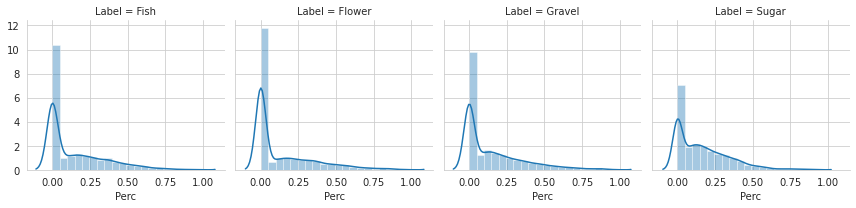

In [ ]:
_, bins = np.histogram(train_data['Perc'], bins=20)
g = sns.FacetGrid(train_data, col='Label')
g = g.map(sns.distplot, 'Perc', bins=bins, norm_hist=True)    # ??? norm_hist doesn't work

In [ ]:
# https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/
# https://medium.com/escaletechblog/writing-custom-aggregation-functions-with-pandas-96f5268a8596
from functools import reduce

def cnt_pos(series):
    return len(series[series > 0])

def mean_pos(series):
    return series[series > 0].mean()

print('Overall {} images. Classes available in:'.format(len(train_data) / 4))
train_data.groupby('Label').agg({'Perc': [cnt_pos, 'mean', mean_pos]})

Overall 5546.0 images. Classes available in:


Perc                    
       cnt_pos      mean  mean_pos
Label                             
Fish    2781.0  0.147783  0.294716
Flower  2365.0  0.138420  0.324599
Gravel  2939.0  0.151119  0.285167
Sugar   3751.0  0.164471  0.243177

### Conclusion

Now we now how many pictures contain each of the class (`cnt_pos`) and also how big part of the picture they usually cover (`mean_pos`).



# Large one-class areas



Having 32 pictures with class coverage > 0.9


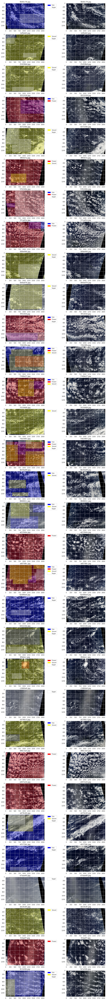

In [ ]:
th = 0.9
outliers = train_data[train_data.Perc > th]
print('Having {} pictures with class coverage > {}'.format(len(outliers), th))

nimg = len(outliers)
_, axes = plt.subplots(nrows=nimg, ncols=2, figsize=(2 * 7, nimg * 4))
for img, (ax1, ax2) in zip(outliers.Image, axes):
    show_image_ax(img, ax1, True)
    show_image_ax(img, ax2, False)

# Classes intersections

* how often which classes intersect?
* outliers: images with the largest number of classes intersected

In [43]:
from itertools import combinations

labels_combinations = [c for length in range(1, 5) for c in combinations(labels, length)]
labels_combinations

[('Fish',),
 ('Flower',),
 ('Gravel',),
 ('Sugar',),
 ('Fish', 'Flower'),
 ('Fish', 'Gravel'),
 ('Fish', 'Sugar'),
 ('Flower', 'Gravel'),
 ('Flower', 'Sugar'),
 ('Gravel', 'Sugar'),
 ('Fish', 'Flower', 'Gravel'),
 ('Fish', 'Flower', 'Sugar'),
 ('Fish', 'Gravel', 'Sugar'),
 ('Flower', 'Gravel', 'Sugar'),
 ('Fish', 'Flower', 'Gravel', 'Sugar')]

**Warning**: takes ~15-20 minutes to calculate


In [ ]:
H, W = 1400, 2100

train_data_by_image = []
print('[{}] Processed {} images'.format(datetime.now(), len(train_data_by_image)))
for image in sorted(set(train_data.Image)):
    row = {'Image': image}
    
    # filter rles and read masks
    masks, available = {}, {}
    for label in labels:
        rle = train_data[(train_data.Image == image) & (train_data.Label == label)]
        assert len(rle) == 1, 'len of filtered by Image {} and Label {} != 1'.format(Image, Label)
        rle = rle['EncodedPixels'].values[0]

        if isinstance(rle, str):
            masks[label] = get_mask_from_rle(rle, H, W)
            available[label] = True
        else:       
            masks[label] = None
            available[label] = False

    # find intersections, calc coverage
    for combination in labels_combinations:
        intersection_meaningful = all(available[label] for label in combination)
        key = '_'.join(combination)
        if not intersection_meaningful:
            row[f'{key}_Perc'] = 0.
            row[f'{key}_Available'] = False
            continue
        
        intersection = np.ones((H, W)).astype(int)
        for label in combination:
            intersection = intersection & masks[label]
        
        row[f'{key}_Perc'] = intersection.mean()
        row[f'{key}_Available'] = True

    train_data_by_image.append(row)
    if len(train_data_by_image) % 100 == 0:
        print('[{}] Processed {} images'.format(datetime.now(), len(train_data_by_image)))

In [49]:
# train_data_by_image = pd.DataFrame(train_data_by_image)
# train_data_by_image.to_csv(f'{path_to_data}/train_by_image.csv')

In [51]:
train_data_by_image

,Image,Fish_Perc,Fish_Available,Flower_Perc,Flower_Available,Gravel_Perc,Gravel_Available,Sugar_Perc,Sugar_Available,Fish_Flower_Perc,Fish_Flower_Available,Fish_Gravel_Perc,Fish_Gravel_Available,Fish_Sugar_Perc,Fish_Sugar_Available,Flower_Gravel_Perc,Flower_Gravel_Available,Flower_Sugar_Perc,Flower_Sugar_Available,Gravel_Sugar_Perc,Gravel_Sugar_Available,Fish_Flower_Gravel_Perc,Fish_Flower_Gravel_Available,Fish_Flower_Sugar_Perc,Fish_Flower_Sugar_Available,Fish_Gravel_Sugar_Perc,Fish_Gravel_Sugar_Available,Flower_Gravel_Sugar_Perc,Flower_Gravel_Sugar_Available,Fish_Flower_Gravel_Sugar_Perc,Fish_Flower_Gravel_Sugar_Available
0,0011165.jpg,0.317113,True,0.393234,True,0.000000,False,0.000000,False,0.066762,True,0.0,False,0.000000,False,0.0,False,0.000000,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False
1,002be4f.jpg,0.572900,True,0.201598,True,0.000000,False,0.106786,True,0.004616,True,0.0,False,0.092619,True,0.0,False,0.000000,True,0.0,False,0.0,False,0.0,True,0.0,False,0.0,False,0.0,False
2,0031ae9.jpg,0.422048,True,0.400972,True,0.000000,False,0.104390,True,0.323047,True,0.0,False,0.000000,True,0.0,False,0.009306,True,0.0,False,0.0,False,0.0,True,0.0,False,0.0,False,0.0,False
3,0035239.jpg,0.000000,False,0.223126,True,0.098619,True,0.000000,False,0.000000,False,0.0,False,0.000000,False,0.0,True,0.000000,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False
4,003994e.jpg,0.062323,True,0.000000,False,0.139657,True,0.073683,True,0.000000,False,0.0,True,0.000000,True,0.0,False,0.000000,False,0.0,True,0.0,False,0.0,False,0.0,True,0.0,False,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5541,ffcedf2.jpg,0.810024,True,0.000000,False,0.000000,False,0.000000,False,0.000000,False,0.0,False,0.000000,False,0.0,False,0.000000,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False
5542,ffd11b6.jpg,0.000000,False,0.273144,True,0.000000,False,0.067142,True,0.000000,False,0.0,False,0.000000,False,0.0,False,0.000292,True,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False
5543,ffd3dfb.jpg,0.000000,False,0.000000,False,0.000000,False,0.421460,True,0.000000,False,0.0,False,0.000000,False,0.0,False,0.000000,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False
5544,ffd6680.jpg,0.000000,False,0.372223,True,0.213850,True,0.000000,False,0.000000,False,0.0,False,0.000000,False,0.0,True,0.000000,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False,0.0,False


In [87]:
n_intersections = {}
for combination in labels_combinations:
    key = '_'.join(combination)
    
    perc = train_data_by_image[train_data_by_image[f'{key}_Available']][f'{key}_Perc']
    perc_gt_0 = perc[perc > 0]
    n_intersections[key] = len(perc_gt_0)

    print((f'For combination {key: >25} having {len(perc): >6} common images' + 
             (f', {len(perc_gt_0): >6} images with intersection' if len(combination) > 1 else '')))

For combination                      Fish having   2781 common images
For combination                    Flower having   2365 common images
For combination                    Gravel having   2939 common images
For combination                     Sugar having   3751 common images
For combination               Fish_Flower having   1045 common images,    691 images with intersection
For combination               Fish_Gravel having   1423 common images,    965 images with intersection
For combination                Fish_Sugar having   1782 common images,   1191 images with intersection
For combination             Flower_Gravel having    926 common images,    496 images with intersection
For combination              Flower_Sugar having   1405 common images,    649 images with intersection
For combination              Gravel_Sugar having   2067 common images,   1575 images with intersection
For combination        Fish_Flower_Gravel having    423 common images,     99 images with intersection

In [84]:
for combination in labels_combinations:
    if len(combination) == 2:
        key = '_'.join(combination)
        l1, l2 = combination
        p1 = 100. * n_intersections[key] / n_intersections[l1]
        p2 = 100. * n_intersections[key] / n_intersections[l2]
        
        print((f'For combination {key: >15} having {n_intersections[key]: >6} intersections:   '
               f'{p1:.1f}% of all {l1: >6} images,    {p2:.1f}% of all {l2: >6} images'
        ))

For combination     Fish_Flower having    691 intersections:   24.8% of all   Fish images,    29.2% of all Flower images
For combination     Fish_Gravel having    965 intersections:   34.7% of all   Fish images,    32.8% of all Gravel images
For combination      Fish_Sugar having   1191 intersections:   42.8% of all   Fish images,    31.8% of all  Sugar images
For combination   Flower_Gravel having    496 intersections:   21.0% of all Flower images,    16.9% of all Gravel images
For combination    Flower_Sugar having    649 intersections:   27.4% of all Flower images,    17.3% of all  Sugar images
For combination    Gravel_Sugar having   1575 intersections:   53.6% of all Gravel images,    42.0% of all  Sugar images


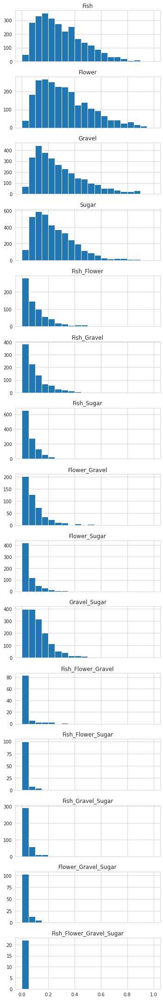

In [90]:
nrows = len(labels_combinations)
bins = np.arange(0, 1.01, 0.05)
_, axes = plt.subplots(nrows=nrows, sharex=True, figsize=(5, nrows * 2))
for combination, ax in zip(labels_combinations, axes):
    key = '_'.join(combination)
    
    perc = train_data_by_image[train_data_by_image[f'{key}_Available']][f'{key}_Perc']
    perc_gt_0 = perc[perc > 0]
    ax.hist(perc_gt_0, bins=bins)
    ax.set_title(key)

plt.tight_layout()

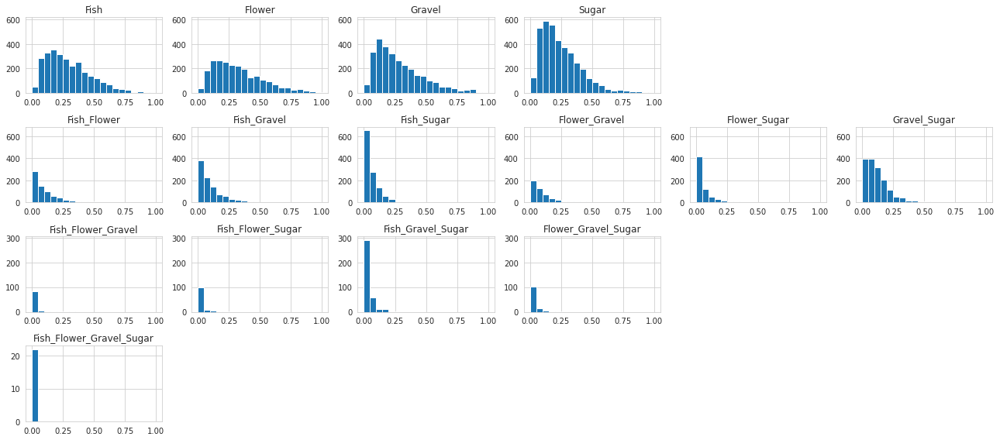

In [103]:
bins = np.arange(0, 1.01, 0.05)
plt.figure(figsize=(6 * 3, 4 * 2))
nrow, ncol = 1, 1
ax, last_ax = None, None
for combination in labels_combinations:
    # get data
    key = '_'.join(combination)
    perc = train_data_by_image[train_data_by_image[f'{key}_Available']][f'{key}_Perc']
    perc_gt_0 = perc[perc > 0]
    
    # determine subplot
    if len(combination) != nrow:
        nrow += 1
        ncol = 1
        ax = None
    last_ax = plt.subplot(4, 6, (nrow - 1) * 6 + ncol, sharey=ax)
    if ncol == 1: ax = last_ax    # sharey by row
    ncol += 1

    # plot histogram
    plt.hist(perc_gt_0, bins=bins)
    plt.title(key)

plt.tight_layout()

### Conclusion

Classes intersection is very common, especially between Gravel and Sugar. On the plot above you can see histograms of the intersection areas (only non-empty) for each classes combination.